<center><font color='green'> Course Name: AMOD 792 - Research Project</font></center>
<center><font color='green'> Project Name: The impact of asthma control functional limitations in adults with asthma</font></center>
<br><font color='green'> Note:</font></br>
<br><font color='green'>
<br>1. Week 1 (9/10-9/23): Reference Reading and Data Code Book Reading - Completed before start programming</br>
<br>2. Week 2 (9/24-9/29):Data import/imputation/normalization/Outliner/Checking/collinearity/other data issue</br>
<br>3. Week 3 (9/30-10/5):Univariate Analysis/ Bivariate Analysis - Basic Statistics</br>
</font></br>
<font color='green'><p>*By Wei Geng(David)*</p></font>
<font color='green'><p>*Professor: Sonja Streuber*</p></font>
<font color='green'><p>*Created on: 09/24/2020*</p></font>
<font color='green'><p>*Last Modified: 10/07/2020*</p></font>

In [1]:
# import all packages
import pandas as pd
from pandas_profiling import ProfileReport
import numpy as np
from scipy import stats
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
# set display options
pd.set_option('display.max_rows',100)
pd.set_option('display.max_columns',100)
pd.set_option('display.width',100)
pd.set_option('display.float_format', lambda x: '%.3f' % x)
kwargs = dict(skipinitialspace=False,engine='c',encoding='ISO-8859-1')

<font color='green'>**-----------------------Part 2:  Week # 2 (9/24-9/29):Data import/imputation/normalization/Outliner/Checking/collinearity/other data issue. ----------------------**</font>

In [3]:
# import NHIS Survey Asthma data - Data collection year is 2016
# this dataset was filtered from the orginal dataset with a filter applied 
# (Only patients admitted to hospital due to asthma attacks but still report having asthma 12 month later)
NHIS_asthma_df=pd.read_csv('https://raw.githubusercontent.com/intelspeedstep/AMOD792/master/ASTHMA_DS.csv',**kwargs, low_memory=False)
print(NHIS_asthma_df.shape)
NHIS_asthma_df.head()

(2806, 1437)


,RECTYPE,SRVY_YR,HHX,INTV_QRT,INTV_MON,FMX,FPX,WTIA,WTFA,REGION,PSTRAT,PPSU,SEX,ORIGIN_I,ORIGIMPT,HISPAN_I,HISPIMPT,RACERPI2,RACEIMP2,MRACRPI2,MRACBPI2,RACRECI3,HISCODI3,ERIMPFLG,NOWAF,RRP,HHREFLG,FRRP,DOB_Y_P,AGE_P,AGE_CHG,FMRPFLG,FMREFLG,R_MARITL,FSPOUS2,COHAB1,COHAB2,FCOHAB3,CDCMSTAT,SIB_DEGP,FMOTHER1,MOM_DEGP,FFATHER1,DAD_DEGP,PARENTS,MOM_ED,DAD_ED,ASTATFLG,CSTATFLG,QCADULT,...,AWEBUSE,AWEBOFNO,AWEBOFTP,AWEBEML,AWEBMNO,AWEBMTP,WTFA_AFD,VIS_0,VIS_SS2,HEAR_1R,HEAR_2R,HEAR_SS2,HEAR_3,HEAR_4,MOB_SS2,MOB_2R,MOB_3A,MOB_3B2,MOB_3C,MOB_3D2,MOB_3E2,MOB_3F,MOB_3G,MOB_4,MOB_5,MOB_6,MOB_7,MOB_8,COM_SS,COM_2,COG_SS,COG_1,COG_2,COG_3,UB_SS,UB_1,UB_2,ANX_1,ANX_2,ANX_3R,DEP_1,DEP_2,DEP_3R,PAIN_2A,PAIN_4,TIRED_1,TIRED_2,TIRED_3,RCS_AFD,ind_severity
0,20 Person,Survey Year,Range of Values,1 Quarter 1,03 March,1,1,Range of Values,Range of Values,2 Midwest,147,3,2 Female,2 No,4 Hispanic origin given by respondent/proxy,12 Not Hispanic/Spanish origin,4 Hispanic Origin type given by respondent/proxy,01 White only,6 Race given by respondent/proxy,01 White,01 White,1 White,2 Non-Hispanic White,2 Ethnicity/race given by respondent/proxy,2 Not Armed Forces,01 Household reference person,P HH Reference person,01 Family reference person,Birth Year,45,nan,B Family respondent,P Family reference person,7 Never married,nan,NaN,NaN,nan,4 Single/never married,NaN,00 Mother not a household member,NaN,00 Father not in household,NaN,4 Neither mother nor father,nan,nan,1 Sample Adult - has record,nan,nan,...,2 No,NaN,NaN,2 No,NaN,NaN,Range of Values,2 No,1 No difficulty,2 No,NaN,1 No difficulty,1 No difficulty,1 No difficulty,1 No difficulty,2 No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1 No difficulty,1 No difficulty,1 No difficulty,NaN,NaN,1 No difficulty,2 No,1 No difficulty,NaN,NaN,NaN,1 No difficulty,1 No difficulty,1 No difficulty,1 Daily,1 Yes,2 A lot,1 Daily,1 Yes,2 A lot,2 Some days,2 A lot,2 Some days,2 Most of the day,2 A lot,4 At least one valid answer,1
1,20 Person,Survey Year,Range of Values,1 Quarter 1,03 March,1,1,Range of Values,Range of Values,4 West,138,4,2 Female,2 No,4 Hispanic origin given by respondent/proxy,12 Not Hispanic/Spanish origin,4 Hispanic Origin type given by respondent/proxy,01 White only,6 Race given by respondent/proxy,01 White,01 White,1 White,2 Non-Hispanic White,2 Ethnicity/race given by respondent/proxy,2 Not Armed Forces,01 Household reference person,P HH Reference person,01 Family reference person,Birth Year,63,nan,B Family respondent,P Family reference person,4 Widowed,nan,NaN,NaN,nan,5 Widowed,NaN,00 Mother not a household member,NaN,00 Father not in household,NaN,4 Neither mother nor father,nan,nan,1 Sample Adult - has record,nan,nan,...,1 Yes,7,2 Per week,1 Yes,7,2 Per week,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
2,20 Person,Survey Year,Range of Values,1 Quarter 1,01 January,1,1,Range of Values,Range of Values,2 Midwest,107,4,2 Female,2 No,4 Hispanic origin given by respondent/proxy,12 Not Hispanic/Spanish origin,4 Hispanic Origin type given by respondent/proxy,01 White only,6 Race given by respondent/proxy,01 White,01 White,1 White,2 Non-Hispanic White,2 Ethnicity/race given by respondent/proxy,2 Not Armed Forces,01 Household reference person,P HH Reference person,01 Family reference person,Birth Year,59,nan,B Family respondent,P Family reference person,7 Never married,nan,NaN,NaN,nan,4 Single/never married,NaN,00 Mother not a household member,NaN,00 Father not in household,NaN,4 Neither mother nor father,nan,nan,1 Sample Adult - has record,nan,nan,...,1 Yes,1,1 Per day,1 Yes,1,1 Per day,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
3,20 Person,Survey Year,Range of Values,1 Quarter 1,02 February,1,2,Range of Values,Range of Values,1 Northeast,110,66,2 Female,2 No,4 Hisp

In [4]:
# Check the variable and their format
NHIS_asthma_df.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2806 entries, 0 to 2805
Data columns (total 1437 columns):
 #    Column        Non-Null Count  Dtype  
---   ------        --------------  -----  
 0    RECTYPE       2806 non-null   object 
 1    SRVY_YR       2806 non-null   object 
 2    HHX           2806 non-null   object 
 3    INTV_QRT      2806 non-null   object 
 4    INTV_MON      2806 non-null   object 
 5    FMX           2806 non-null   int64  
 6    FPX           2806 non-null   int64  
 7    WTIA          2806 non-null   object 
 8    WTFA          2806 non-null   object 
 9    REGION        2806 non-null   object 
 10   PSTRAT        2806 non-null   int64  
 11   PPSU          2806 non-null   int64  
 12   SEX           2806 non-null   object 
 13   ORIGIN_I      2806 non-null   object 
 14   ORIGIMPT      2806 non-null   object 
 15   HISPAN_I      2806 non-null   object 
 16   HISPIMPT      2806 non-null   object 
 17   RACERPI2      2806 non-null   object 
 18   RACEI

In [5]:
# select the variables that is related asthma and mental or physical functionalities
cols = ['REGION','RACRECI3', 'SEX','NOWAF', 'FRRP', 'AGE_P', 'R_MARITL','MOM_ED', 'DAD_ED', 'HISCODI3', 'EDUC1', 'COVER', 'COVER65', 'AASMYR', 'AASERYR1',
'ASISLEEP', 'ASISLPFL', 'ASISLPST', 'ASISLPMD', 'ASIREST', 'DEP_1','HEAR_SS2', 'VIS_SS2', 'MOB_SS2', 'COM_SS', 'COG_SS', 'UB_SS']
NHIS_asthma_selected_vars=NHIS_asthma_df[cols]
NHIS_asthma_selected_vars.head()

,REGION,RACRECI3,SEX,NOWAF,FRRP,AGE_P,R_MARITL,MOM_ED,DAD_ED,HISCODI3,EDUC1,COVER,COVER65,AASMYR,AASERYR1,ASISLEEP,ASISLPFL,ASISLPST,ASISLPMD,ASIREST,DEP_1,HEAR_SS2,VIS_SS2,MOB_SS2,COM_SS,COG_SS,UB_SS
0,2 Midwest,1 White,2 Female,2 Not Armed Forces,01 Family reference person,45,7 Never married,nan,nan,2 Non-Hispanic White,"15 Some college, no degree",2 Medicaid and other public,NaN,1 Yes,2 No,6,07 7 or more times,07 7 or more times,07 7 or more times,6,1 Daily,1 No difficulty,1 No difficulty,1 No difficulty,1 No difficulty,1 No difficulty,1 No difficulty
1,4 West,1 White,2 Female,2 Not Armed Forces,01 Family reference person,63,4 Widowed,nan,nan,2 Non-Hispanic White,"19 Master's degree (Example: MA, MS, MEng, MEd...",1 Private,NaN,2 No,2 No,6,1,00 Did not have trouble staying asleep in the ...,00 Did not take medication to help sleep in th...,00 Never felt rested in the past week,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2 Midwest,1 White,2 Female,2 Not Armed Forces,01 Family reference person,59,7 Never married,nan,nan,2 Non-Hispanic White,"18 Bachelor's degree (Example: BA, AB, BS, BBA)",1 Private,NaN,2 No,2 No,8,1,1,00 Did not take medication to help sleep in th...,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1 Northeast,1 White,2 Female,2 Not Armed Forces,02 Spouse (husband/wife),46,1 Married - spouse in household,nan,nan,2 Non-Hispanic White,17 Associate degree: academic program,1 Private,NaN,1 Yes,2 No,6,00 Did not have trouble falling asleep in the ...,00 Did not have trouble staying asleep in the ...,00 Did not take medication to help sleep in th...,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3 South,1 White,2 Female,NaN,01 Family reference person,85 85+ years,4 Widowed,nan,nan,2 Non-Hispanic White,"15 Some college, no degree",NaN,3 Medicare Advantage,2 No,2 No,5,07 7 or more times,5,07 7 or more times,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
# profiling the dataset with pandas-profiling package
# ProfileReport output the report to check 
# imputation/normalization/Outliner/Checking/collinearity/other data issue
profile = ProfileReport(NHIS_asthma_selected_vars, title='Pandas Profiling Report', explorative=True)
profile

C:\Users\toshi\anaconda3\lib\site-packages\pandas\core\frame.py:4296: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


In [7]:
# from the profiling report report we will drop the columns with too many missing values
NHIS_asthma_selected_vars.drop(['MOM_ED', 'DAD_ED','COVER65'],axis=1, inplace=True)
NHIS_asthma_selected_vars.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2806 entries, 0 to 2805
Data columns (total 24 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   REGION    2806 non-null   object
 1   RACRECI3  2806 non-null   object
 2   SEX       2806 non-null   object
 3   NOWAF     2139 non-null   object
 4   FRRP      2806 non-null   object
 5   AGE_P     2806 non-null   object
 6   R_MARITL  2806 non-null   object
 7   HISCODI3  2806 non-null   object
 8   EDUC1     2806 non-null   object
 9   COVER     2139 non-null   object
 10  AASMYR    2806 non-null   object
 11  AASERYR1  2806 non-null   object
 12  ASISLEEP  2806 non-null   object
 13  ASISLPFL  2806 non-null   object
 14  ASISLPST  2806 non-null   object
 15  ASISLPMD  2806 non-null   object
 16  ASIREST   2806 non-null   object
 17  DEP_1     1409 non-null   object
 18  HEAR_SS2  1409 non-null   object
 19  VIS_SS2   1409 non-null   object
 20  MOB_SS2   1409 non-null   object
 21  COM_SS    1409

C:\Users\toshi\anaconda3\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [8]:
# from the profiling report report we will drop the columns with one 1 value
NHIS_asthma_selected_vars.drop(['NOWAF'],axis=1, inplace=True)
NHIS_asthma_selected_vars.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2806 entries, 0 to 2805
Data columns (total 23 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   REGION    2806 non-null   object
 1   RACRECI3  2806 non-null   object
 2   SEX       2806 non-null   object
 3   FRRP      2806 non-null   object
 4   AGE_P     2806 non-null   object
 5   R_MARITL  2806 non-null   object
 6   HISCODI3  2806 non-null   object
 7   EDUC1     2806 non-null   object
 8   COVER     2139 non-null   object
 9   AASMYR    2806 non-null   object
 10  AASERYR1  2806 non-null   object
 11  ASISLEEP  2806 non-null   object
 12  ASISLPFL  2806 non-null   object
 13  ASISLPST  2806 non-null   object
 14  ASISLPMD  2806 non-null   object
 15  ASIREST   2806 non-null   object
 16  DEP_1     1409 non-null   object
 17  HEAR_SS2  1409 non-null   object
 18  VIS_SS2   1409 non-null   object
 19  MOB_SS2   1409 non-null   object
 20  COM_SS    1409 non-null   object
 21  COG_SS    1409

In [9]:
# Use One Hot method to recoding REGION variable so that it will be a dummy variable
one_hot = pd.get_dummies(NHIS_asthma_selected_vars['REGION'], prefix='REGION', drop_first=True)
dataset_clean = NHIS_asthma_selected_vars.drop('REGION',axis=1)
dataset_clean = dataset_clean.join(one_hot)

In [10]:
# Use One Hot method to recoding RACRECI3 variable so that it will be a dummy variable
one_hot = pd.get_dummies(NHIS_asthma_selected_vars['RACRECI3'], prefix='RACRECI3', drop_first=True)
dataset_clean = dataset_clean.drop('RACRECI3',axis=1)
dataset_clean = dataset_clean.join(one_hot)

In [11]:
# Use One Hot method to recoding SEX variable so that it will be a dummy variable
one_hot = pd.get_dummies(NHIS_asthma_selected_vars['SEX'], prefix='SEX', drop_first=True)
dataset_clean = dataset_clean.drop('SEX',axis=1)
dataset_clean = dataset_clean.join(one_hot)

In [12]:
# Use One Hot method to recoding FRRP variable so that it will be a dummy variable
one_hot = pd.get_dummies(NHIS_asthma_selected_vars['FRRP'], prefix='FRRP', drop_first=True)
dataset_clean = dataset_clean.drop('FRRP',axis=1)
dataset_clean = dataset_clean.join(one_hot)

In [13]:
# Use One Hot method to recoding R_MARITL variable so that it will be a dummy variable
one_hot = pd.get_dummies(NHIS_asthma_selected_vars['R_MARITL'], prefix='R_MARITL', drop_first=True)
dataset_clean = dataset_clean.drop('R_MARITL',axis=1)
dataset_clean = dataset_clean.join(one_hot)

In [14]:
# Use One Hot method to recoding HISCODI3 variable so that it will be a dummy variable
one_hot = pd.get_dummies(NHIS_asthma_selected_vars['HISCODI3'], prefix='HISCODI3', drop_first=True)
dataset_clean = dataset_clean.drop('HISCODI3',axis=1)
dataset_clean = dataset_clean.join(one_hot)

In [15]:
# Use One Hot method to recoding EDUC1 variable so that it will be a dummy variable
one_hot = pd.get_dummies(NHIS_asthma_selected_vars['EDUC1'], prefix='EDUC1', drop_first=True)
dataset_clean = dataset_clean.drop('EDUC1',axis=1)
dataset_clean = dataset_clean.join(one_hot)

In [16]:
# Use One Hot method to recoding COVER variable so that it will be a dummy variable
one_hot = pd.get_dummies(NHIS_asthma_selected_vars['COVER'], prefix='COVER', drop_first=True)
dataset_clean = dataset_clean.drop('COVER',axis=1)
dataset_clean = dataset_clean.join(one_hot)

In [17]:
# output the dataset after converting categorical variables to dummy variables by using in one hot method 
dataset_clean.head()

,AGE_P,AASMYR,AASERYR1,ASISLEEP,ASISLPFL,ASISLPST,ASISLPMD,ASIREST,DEP_1,HEAR_SS2,VIS_SS2,MOB_SS2,COM_SS,COG_SS,UB_SS,REGION_2 Midwest,REGION_3 South,REGION_4 West,RACRECI3_2 Black,RACRECI3_3 Asian,RACRECI3_4 All other race groups (See file layout),SEX_2 Female,FRRP_02 Spouse (husband/wife),FRRP_03 Unmarried Partner,FRRP_04 Child (biological/adoptive/in-law/step/foster),FRRP_06 Grandchild,FRRP_07 Parent (biological/adoptive/in-law/step/foster),FRRP_08 Brother/sister (biological/adoptive/in-law/step/foster),FRRP_09 Grandparent (Grandmother/Grandfather),FRRP_10 Aunt/Uncle,FRRP_11 Niece/Nephew,FRRP_12 Other relative,FRRP_98 Not ascertained,R_MARITL_2 Married - spouse not in household,R_MARITL_4 Widowed,R_MARITL_5 Divorced,R_MARITL_6 Separated,R_MARITL_7 Never married,R_MARITL_8 Living with partner,R_MARITL_9 Unknown marital status,HISCODI3_2 Non-Hispanic White,HISCODI3_3 Non-Hispanic Black,HISCODI3_4 Non-Hispanic Asian,HISCODI3_5 Non-Hispanic All other race groups,EDUC1_01 1st grade,EDUC1_02 2nd grade,EDUC1_03 3rd grade,EDUC1_04 4th grade,EDUC1_05 5th grade,EDUC1_06 6th grade,EDUC1_07 7th grade,EDUC1_08 8th grade,EDUC1_09 9th grade,EDUC1_10 10th grade,EDUC1_11 11th grade,"EDUC1_12 12th grade, no diploma",EDUC1_13 GED or equivalent,EDUC1_14 High School Graduate,"EDUC1_15 Some college, no degree","EDUC1_16 Associate degree: occupational, technical, or vocational program",EDUC1_17 Associate degree: academic program,"EDUC1_18 Bachelor's degree (Example: BA, AB, BS, BBA)","EDUC1_19 Master's degree (Example: MA, MS, MEng, MEd, MBA)","EDUC1_20 Professional School degree (Example: MD, DDS, DVM, JD)","EDUC1_21 Doctoral degree (Example: PhD, EdD)",EDUC1_99 Don't know,COVER_2 Medicaid and other public,COVER_3 Other coverage,COVER_4 Uninsured,COVER_5 Don't know
0,45,1 Yes,2 No,6,07 7 or more times,07 7 or more times,07 7 or more times,6,1 Daily,1 No difficulty,1 No difficulty,1 No difficulty,1 No difficulty,1 No difficulty,1 No difficulty,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0
1,63,2 No,2 No,6,1,00 Did not have trouble staying asleep in the ...,00 Did not take medication to help sleep in th...,00 Never felt rested in the past week,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2,59,2 No,2 No,8,1,1,00 Did not take medication to help sleep in th...,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,46,1 Yes,2 No,6,00 Did not have trouble falling asleep in the ...,00 Did not have trouble staying asleep in the ...,00 Did not take medication to help sleep in th...,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
4,85 85+ years,2 No,2 No,5,07 7 or more times,5,07 7 or more times,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0


In [18]:
# covert object variable to numeric variable for modeling prep.
dataset_clean.AGE_P=dataset_clean.AGE_P.str.slice(0,2).astype(int)
dataset_clean.AASMYR=dataset_clean.AASMYR.str.slice(0,1).astype(float)
dataset_clean.AASMYR=dataset_clean.AASMYR.map({1:1,2:0,9:0})
dataset_clean.AASERYR1=dataset_clean.AASERYR1.str.slice(0,1).astype(float)
dataset_clean.AASERYR1=dataset_clean.AASERYR1.map({1:1,2:0,7:0,9:0})
dataset_clean.ASISLEEP=dataset_clean.ASISLEEP.str.slice(0,2).astype(float)
dataset_clean.loc[dataset_clean.ASISLEEP.isin([97,98,99]),'ASISLEEP']=np.nan
dataset_clean.ASISLEEP.fillna(dataset_clean.ASISLEEP.mean(), inplace=True)
dataset_clean.ASISLPFL=dataset_clean.ASISLPFL.str.slice(0,2).astype(float)
dataset_clean.loc[dataset_clean.ASISLPFL.isin([97,98,99]),'ASISLPFL']=np.nan
dataset_clean.ASISLPFL.fillna(dataset_clean.ASISLPFL.mean(), inplace=True)
dataset_clean.ASISLPST=dataset_clean.ASISLPST.str.slice(0,2).astype(float)
dataset_clean.loc[dataset_clean.ASISLPST.isin([97,98,99]),'ASISLPST']=np.nan
dataset_clean.ASISLPST.fillna(dataset_clean.ASISLPST.mean(), inplace=True)
dataset_clean.ASISLPMD=dataset_clean.ASISLPMD.str.slice(0,2).astype(float)
dataset_clean.loc[dataset_clean.ASISLPMD.isin([97,98,99]),'ASISLPMD']=np.nan
dataset_clean.ASISLPMD.fillna(dataset_clean.ASISLPMD.mean(), inplace=True)
dataset_clean.ASIREST=dataset_clean.ASIREST.str.slice(0,2).astype(float)
dataset_clean.loc[dataset_clean.ASIREST.isin([97,98,99]),'ASIREST']=np.nan
dataset_clean.ASIREST.fillna(dataset_clean.ASIREST.mean(), inplace=True)
dataset_clean.head()

,AGE_P,AASMYR,AASERYR1,ASISLEEP,ASISLPFL,ASISLPST,ASISLPMD,ASIREST,DEP_1,HEAR_SS2,VIS_SS2,MOB_SS2,COM_SS,COG_SS,UB_SS,REGION_2 Midwest,REGION_3 South,REGION_4 West,RACRECI3_2 Black,RACRECI3_3 Asian,RACRECI3_4 All other race groups (See file layout),SEX_2 Female,FRRP_02 Spouse (husband/wife),FRRP_03 Unmarried Partner,FRRP_04 Child (biological/adoptive/in-law/step/foster),FRRP_06 Grandchild,FRRP_07 Parent (biological/adoptive/in-law/step/foster),FRRP_08 Brother/sister (biological/adoptive/in-law/step/foster),FRRP_09 Grandparent (Grandmother/Grandfather),FRRP_10 Aunt/Uncle,FRRP_11 Niece/Nephew,FRRP_12 Other relative,FRRP_98 Not ascertained,R_MARITL_2 Married - spouse not in household,R_MARITL_4 Widowed,R_MARITL_5 Divorced,R_MARITL_6 Separated,R_MARITL_7 Never married,R_MARITL_8 Living with partner,R_MARITL_9 Unknown marital status,HISCODI3_2 Non-Hispanic White,HISCODI3_3 Non-Hispanic Black,HISCODI3_4 Non-Hispanic Asian,HISCODI3_5 Non-Hispanic All other race groups,EDUC1_01 1st grade,EDUC1_02 2nd grade,EDUC1_03 3rd grade,EDUC1_04 4th grade,EDUC1_05 5th grade,EDUC1_06 6th grade,EDUC1_07 7th grade,EDUC1_08 8th grade,EDUC1_09 9th grade,EDUC1_10 10th grade,EDUC1_11 11th grade,"EDUC1_12 12th grade, no diploma",EDUC1_13 GED or equivalent,EDUC1_14 High School Graduate,"EDUC1_15 Some college, no degree","EDUC1_16 Associate degree: occupational, technical, or vocational program",EDUC1_17 Associate degree: academic program,"EDUC1_18 Bachelor's degree (Example: BA, AB, BS, BBA)","EDUC1_19 Master's degree (Example: MA, MS, MEng, MEd, MBA)","EDUC1_20 Professional School degree (Example: MD, DDS, DVM, JD)","EDUC1_21 Doctoral degree (Example: PhD, EdD)",EDUC1_99 Don't know,COVER_2 Medicaid and other public,COVER_3 Other coverage,COVER_4 Uninsured,COVER_5 Don't know
0,45,1,0,6.000,7.000,7.000,7.000,6.000,1 Daily,1 No difficulty,1 No difficulty,1 No difficulty,1 No difficulty,1 No difficulty,1 No difficulty,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0
1,63,0,0,6.000,1.000,0.000,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2,59,0,0,8.000,1.000,1.000,0.000,7.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,46,1,0,6.000,0.000,0.000,0.000,5.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
4,85,0,0,5.000,7.000,5.000,7.000,7.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0


In [19]:
dataset_clean.DEP_1=dataset_clean.DEP_1.str.slice(0,1).astype(float)
dataset_clean.loc[dataset_clean.DEP_1<5,'TARGET_DEP']=1
dataset_clean.TARGET_DEP.fillna(0, inplace=True)
dataset_clean.HEAR_SS2=dataset_clean.HEAR_SS2.str.slice(0,1).astype(float)
dataset_clean.loc[dataset_clean.HEAR_SS2.isin([2,3,4]),'TARGET_HEAR']=1
dataset_clean.TARGET_HEAR.fillna(0, inplace=True)
dataset_clean.VIS_SS2=dataset_clean.VIS_SS2.str.slice(0,1).astype(float)
dataset_clean.loc[dataset_clean.VIS_SS2.isin([2,3,4]),'TARGET_VIS']=1
dataset_clean.TARGET_VIS.fillna(0, inplace=True)
dataset_clean.MOB_SS2=dataset_clean.MOB_SS2.str.slice(0,1).astype(float)
dataset_clean.loc[dataset_clean.MOB_SS2.isin([2,3,4]),'TARGET_MOB']=1
dataset_clean.TARGET_MOB.fillna(0, inplace=True)
dataset_clean.COM_SS=dataset_clean.COM_SS.str.slice(0,1).astype(float)
dataset_clean.loc[dataset_clean.COM_SS.isin([2,3,4]),'TARGET_COM']=1
dataset_clean.TARGET_COM.fillna(0, inplace=True)
dataset_clean.COG_SS=dataset_clean.COG_SS.str.slice(0,1).astype(float)
dataset_clean.loc[dataset_clean.COG_SS.isin([2,3,4]),'TARGET_COG']=1
dataset_clean.TARGET_COG.fillna(0, inplace=True)
dataset_clean.UB_SS=dataset_clean.UB_SS.str.slice(0,1).astype(float)
dataset_clean.loc[dataset_clean.UB_SS.isin([2,3,4]),'TARGET_UB']=1
dataset_clean.TARGET_UB.fillna(0, inplace=True)
drop_list=['DEP_1','HEAR_SS2','VIS_SS2','MOB_SS2','COM_SS','COG_SS','UB_SS']
dataset_clean.drop(columns=drop_list, inplace=True )
dataset_clean.head()

,AGE_P,AASMYR,AASERYR1,ASISLEEP,ASISLPFL,ASISLPST,ASISLPMD,ASIREST,REGION_2 Midwest,REGION_3 South,REGION_4 West,RACRECI3_2 Black,RACRECI3_3 Asian,RACRECI3_4 All other race groups (See file layout),SEX_2 Female,FRRP_02 Spouse (husband/wife),FRRP_03 Unmarried Partner,FRRP_04 Child (biological/adoptive/in-law/step/foster),FRRP_06 Grandchild,FRRP_07 Parent (biological/adoptive/in-law/step/foster),FRRP_08 Brother/sister (biological/adoptive/in-law/step/foster),FRRP_09 Grandparent (Grandmother/Grandfather),FRRP_10 Aunt/Uncle,FRRP_11 Niece/Nephew,FRRP_12 Other relative,FRRP_98 Not ascertained,R_MARITL_2 Married - spouse not in household,R_MARITL_4 Widowed,R_MARITL_5 Divorced,R_MARITL_6 Separated,R_MARITL_7 Never married,R_MARITL_8 Living with partner,R_MARITL_9 Unknown marital status,HISCODI3_2 Non-Hispanic White,HISCODI3_3 Non-Hispanic Black,HISCODI3_4 Non-Hispanic Asian,HISCODI3_5 Non-Hispanic All other race groups,EDUC1_01 1st grade,EDUC1_02 2nd grade,EDUC1_03 3rd grade,EDUC1_04 4th grade,EDUC1_05 5th grade,EDUC1_06 6th grade,EDUC1_07 7th grade,EDUC1_08 8th grade,EDUC1_09 9th grade,EDUC1_10 10th grade,EDUC1_11 11th grade,"EDUC1_12 12th grade, no diploma",EDUC1_13 GED or equivalent,EDUC1_14 High School Graduate,"EDUC1_15 Some college, no degree","EDUC1_16 Associate degree: occupational, technical, or vocational program",EDUC1_17 Associate degree: academic program,"EDUC1_18 Bachelor's degree (Example: BA, AB, BS, BBA)","EDUC1_19 Master's degree (Example: MA, MS, MEng, MEd, MBA)","EDUC1_20 Professional School degree (Example: MD, DDS, DVM, JD)","EDUC1_21 Doctoral degree (Example: PhD, EdD)",EDUC1_99 Don't know,COVER_2 Medicaid and other public,COVER_3 Other coverage,COVER_4 Uninsured,COVER_5 Don't know,TARGET_DEP,TARGET_HEAR,TARGET_VIS,TARGET_MOB,TARGET_COM,TARGET_COG,TARGET_UB
0,45,1,0,6.000,7.000,7.000,7.000,6.000,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1.000,0.000,0.000,0.000,0.000,0.000,0.000
1,63,0,0,6.000,1.000,0.000,0.000,0.000,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2,59,0,0,8.000,1.000,1.000,0.000,7.000,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.000,0.000,0.000
3,46,1,0,6.000,0.000,0.000,0.000,5.000,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.000,0.000,0.000
4,85,0,0,5.000,7.000,5.000,7.000,7.000,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.000,0.000,0.000


<font color='green'>**-----------------------Part 3:  Week # 3 (09/30-10/07):Univariate Analysis/ Bivariate Analysis - Basic Statistics
 . ----------------------**</font>

In [20]:
# profiling the dataset again with pandas-profiling package, 
# this time is to final check the dataset before entering Bivariate anlysis
profile = ProfileReport(dataset_clean, title='Pandas Profiling Report', explorative=True)
profile

In [21]:
# traditional discriptive analysis
dataset_clean.describe()

,AGE_P,AASMYR,AASERYR1,ASISLEEP,ASISLPFL,ASISLPST,ASISLPMD,ASIREST,REGION_2 Midwest,REGION_3 South,REGION_4 West,RACRECI3_2 Black,RACRECI3_3 Asian,RACRECI3_4 All other race groups (See file layout),SEX_2 Female,FRRP_02 Spouse (husband/wife),FRRP_03 Unmarried Partner,FRRP_04 Child (biological/adoptive/in-law/step/foster),FRRP_06 Grandchild,FRRP_07 Parent (biological/adoptive/in-law/step/foster),FRRP_08 Brother/sister (biological/adoptive/in-law/step/foster),FRRP_09 Grandparent (Grandmother/Grandfather),FRRP_10 Aunt/Uncle,FRRP_11 Niece/Nephew,FRRP_12 Other relative,FRRP_98 Not ascertained,R_MARITL_2 Married - spouse not in household,R_MARITL_4 Widowed,R_MARITL_5 Divorced,R_MARITL_6 Separated,R_MARITL_7 Never married,R_MARITL_8 Living with partner,R_MARITL_9 Unknown marital status,HISCODI3_2 Non-Hispanic White,HISCODI3_3 Non-Hispanic Black,HISCODI3_4 Non-Hispanic Asian,HISCODI3_5 Non-Hispanic All other race groups,EDUC1_01 1st grade,EDUC1_02 2nd grade,EDUC1_03 3rd grade,EDUC1_04 4th grade,EDUC1_05 5th grade,EDUC1_06 6th grade,EDUC1_07 7th grade,EDUC1_08 8th grade,EDUC1_09 9th grade,EDUC1_10 10th grade,EDUC1_11 11th grade,"EDUC1_12 12th grade, no diploma",EDUC1_13 GED or equivalent,EDUC1_14 High School Graduate,"EDUC1_15 Some college, no degree","EDUC1_16 Associate degree: occupational, technical, or vocational program",EDUC1_17 Associate degree: academic program,"EDUC1_18 Bachelor's degree (Example: BA, AB, BS, BBA)","EDUC1_19 Master's degree (Example: MA, MS, MEng, MEd, MBA)","EDUC1_20 Professional School degree (Example: MD, DDS, DVM, JD)","EDUC1_21 Doctoral degree (Example: PhD, EdD)",EDUC1_99 Don't know,COVER_2 Medicaid and other public,COVER_3 Other coverage,COVER_4 Uninsured,COVER_5 Don't know,TARGET_DEP,TARGET_HEAR,TARGET_VIS,TARGET_MOB,TARGET_COM,TARGET_COG,TARGET_UB
count,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000,2806.000
mean,50.016,0.453,0.113,6.907,2.200,2.703,1.283,3.449,0.226,0.325,0.257,0.146,0.033,0.024,0.679,0.158,0.020,0.046,0.002,0.013,0.008,0.001,0.000,0.001,0.003,0.000,0.012,0.105,0.173,0.032,0.240,0.062,0.001,0.711,0.140,0.032,0.021,0.001,0.000,0.001,0.002,0.004,0.006,0.003,0.014,0.022,0.027,0.031,0.023,0.036,0.208,0.231,0.079,0.037,0.167,0.079,0.012,0.014,0.001,0.185,0.059,0.061,0.002,0.257,0.118,0.109,0.157,0.033,0.136,0.030
std,17.793,0.498,0.317,1.642,2.734,2.992,2.506,2.748,0.419,0.468,0.437,0.353,0.180,0.154,0.467,0.365,0.140,0.210,0.042,0.114,0.090,0.033,0.019,0.033,0.053,0.019,0.111,0.307,0.378,0.177,0.427,0.241,0.038,0.454,0.347,0.177,0.143,0.027,0.019,0.033,0.050,0.060,0.080,0.053,0.119,0.147,0.163,0.173,0.149,0.185,0.406,0.422,0.269,0.189,0.373,0.269,0.111,0.116,0.038,0.388,0.235,0.239,0.046,0.437,0.323,0.312,0.364,0.180,0.343,0.169
min,18.000,0.000,0.000,2.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,36.000,0.000,0.000,6.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


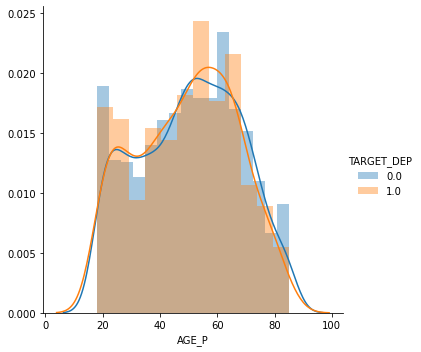

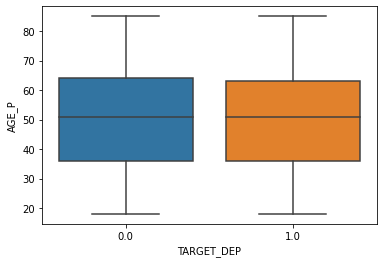

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


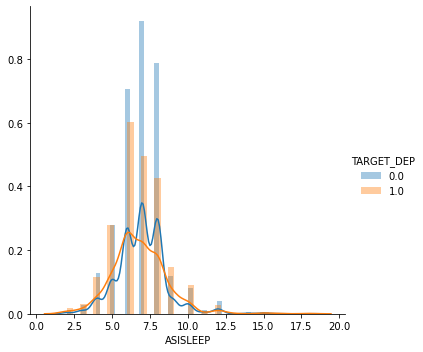

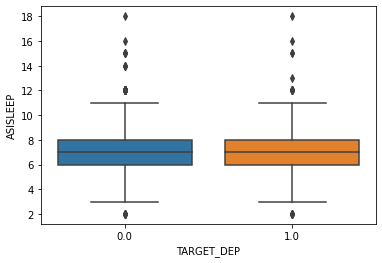

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


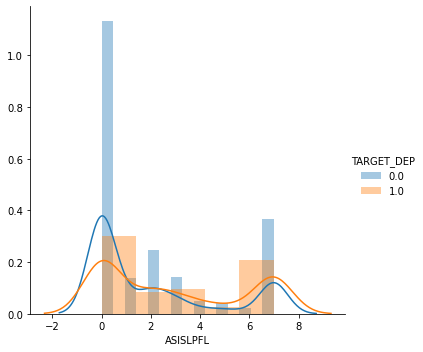

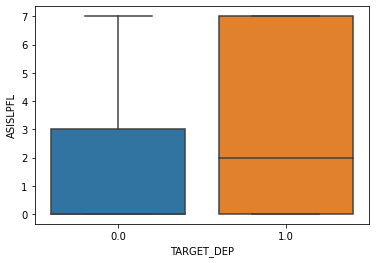

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


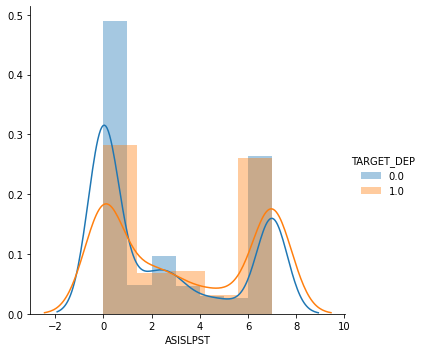

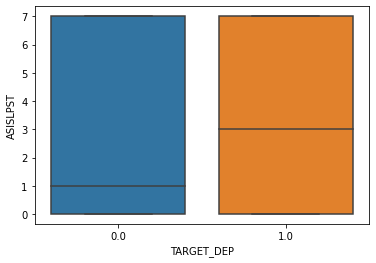

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


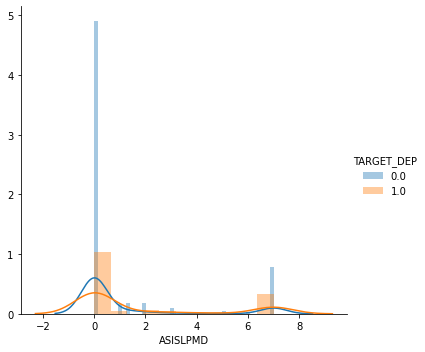

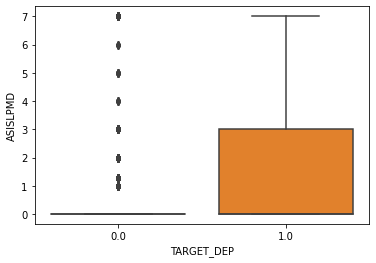

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


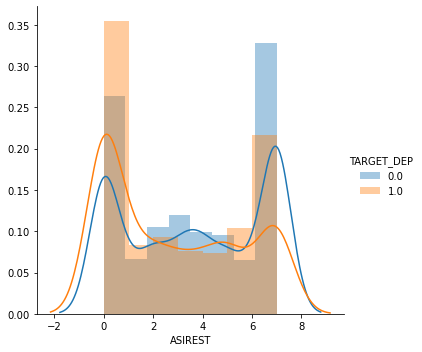

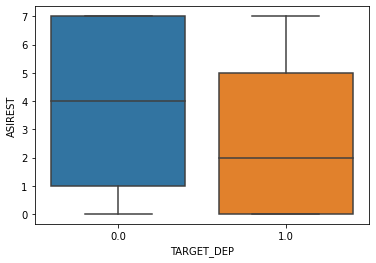

In [22]:
# Bivariate analysis - barplot and boxplot to check the distribution  for target depression variable
numeric_var=['AGE_P','ASISLEEP','ASISLPFL','ASISLPST','ASISLPMD','ASIREST']
for var in numeric_var:
    sns.FacetGrid(dataset_clean, hue="TARGET_DEP", size=5).map(sns.distplot,var).add_legend()
    plt.show()
    sns.boxplot(x="TARGET_DEP", y=var, data=dataset_clean)
    plt.show()

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


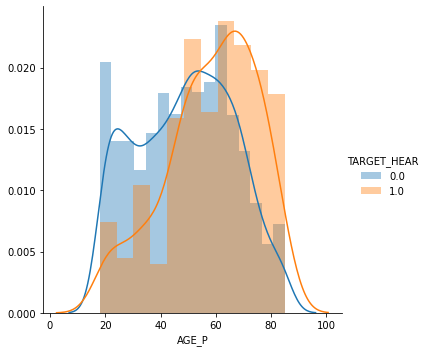

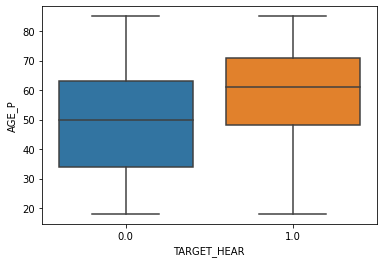

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


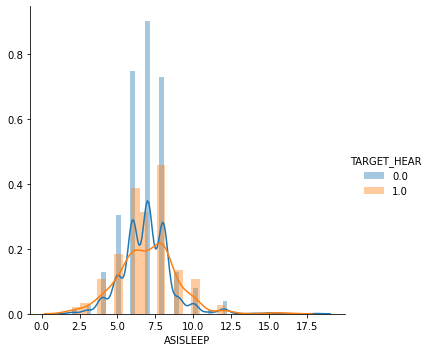

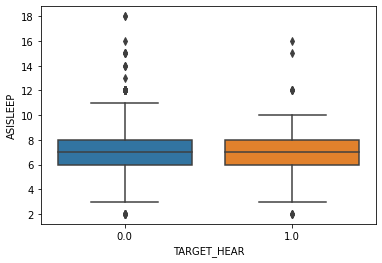

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


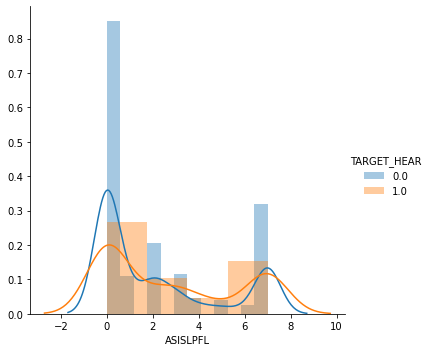

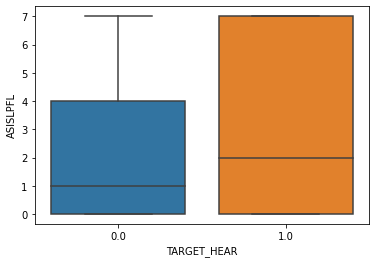

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


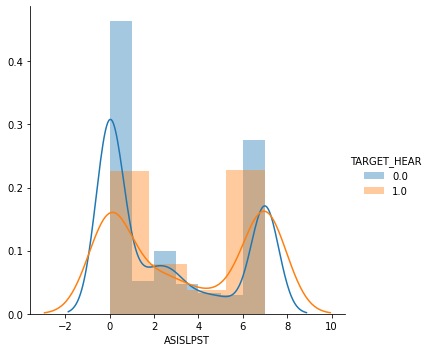

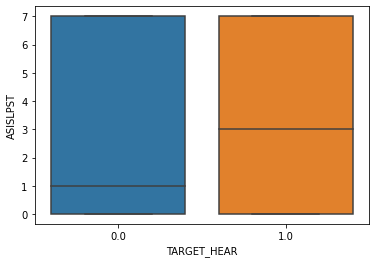

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


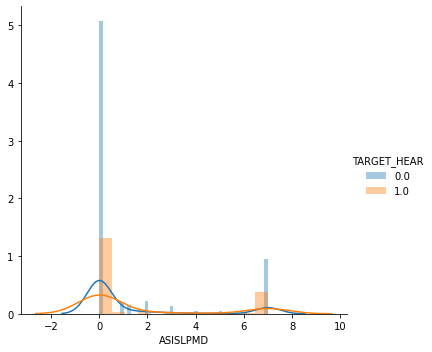

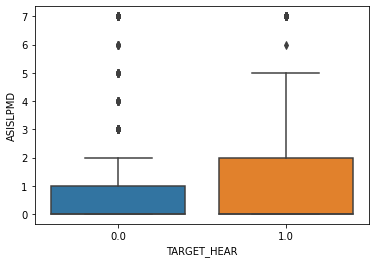

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


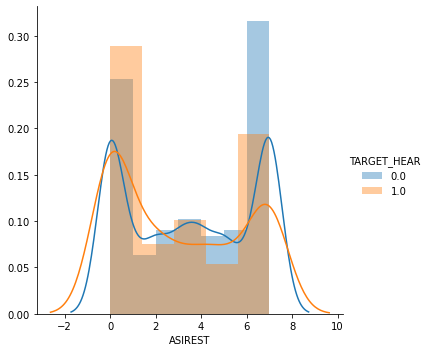

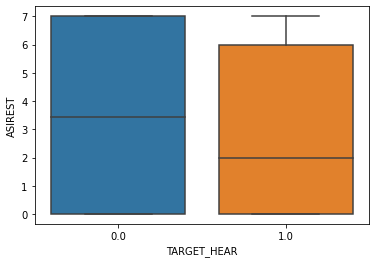

In [23]:
# Bivariate analysis - barplot and boxplot to check the distribution  for target hearing variable
numeric_var=['AGE_P','ASISLEEP','ASISLPFL','ASISLPST','ASISLPMD','ASIREST']
for var in numeric_var:
    sns.FacetGrid(dataset_clean, hue="TARGET_HEAR", size=5).map(sns.distplot,var).add_legend()
    plt.show()
    sns.boxplot(x="TARGET_HEAR", y=var, data=dataset_clean)
    plt.show()

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


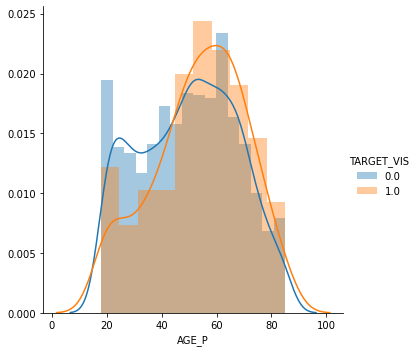

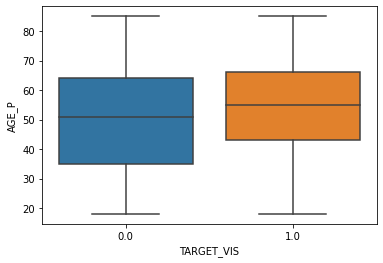

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


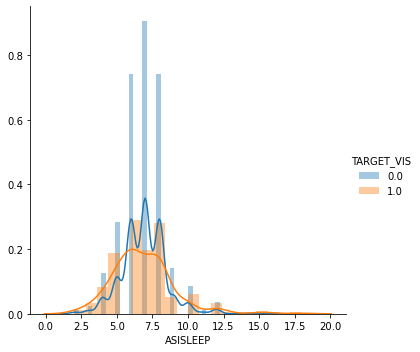

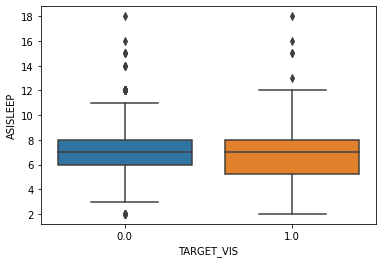

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


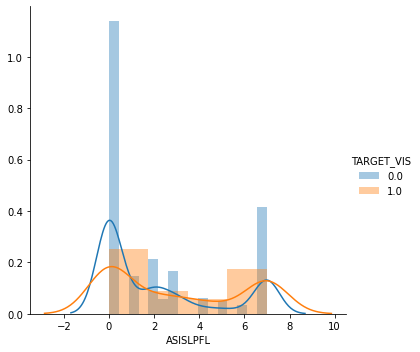

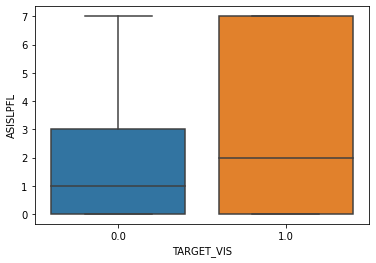

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


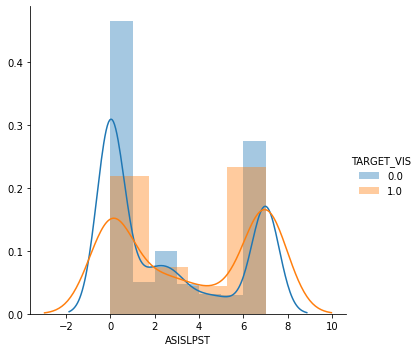

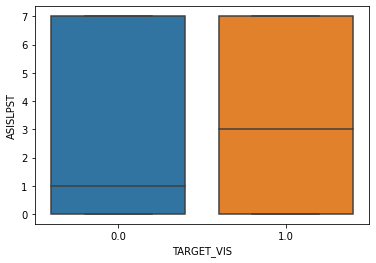

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


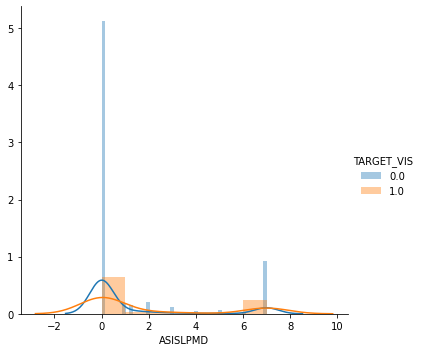

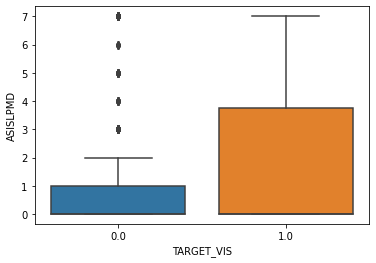

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


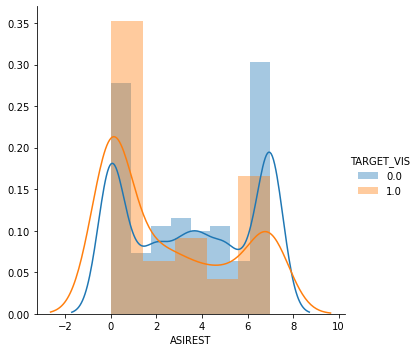

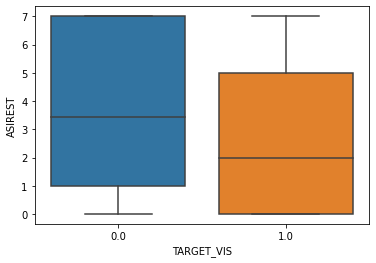

In [24]:
# Bivariate analysis - barplot and boxplot to check the distribution  for target vision variable
numeric_var=['AGE_P','ASISLEEP','ASISLPFL','ASISLPST','ASISLPMD','ASIREST']
for var in numeric_var:
    sns.FacetGrid(dataset_clean, hue="TARGET_VIS", size=5).map(sns.distplot,var).add_legend()
    plt.show()
    sns.boxplot(x="TARGET_VIS", y=var, data=dataset_clean)
    plt.show()

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


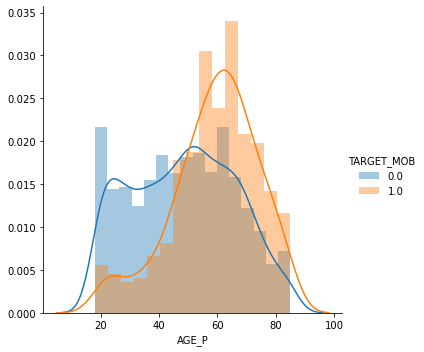

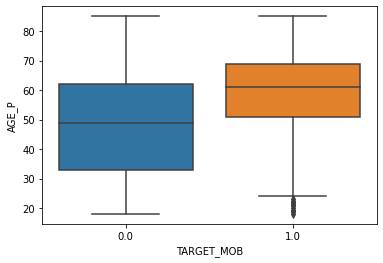

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


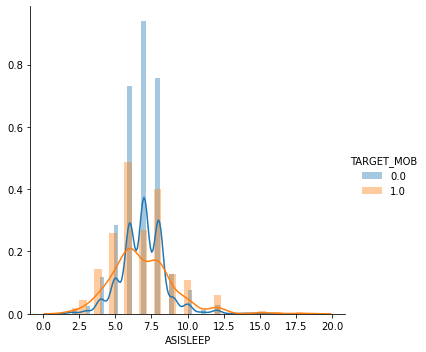

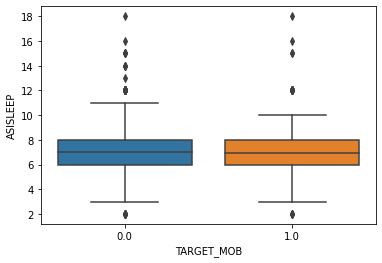

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


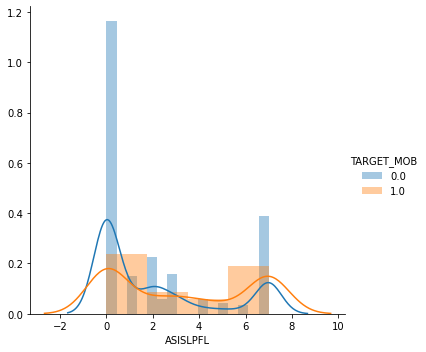

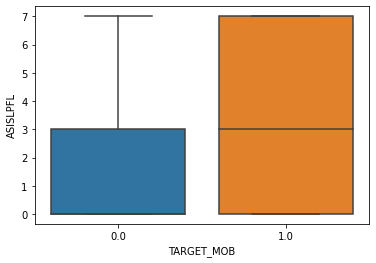

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


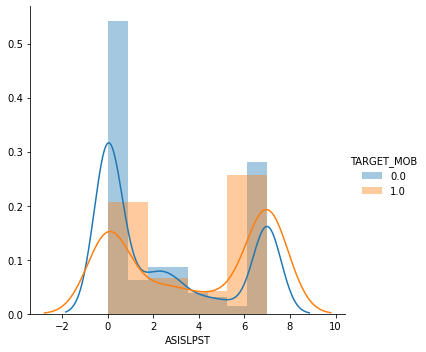

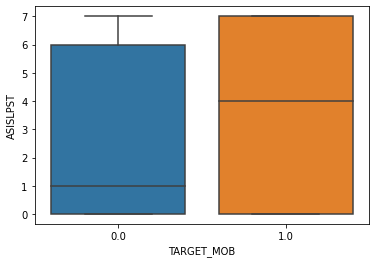

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


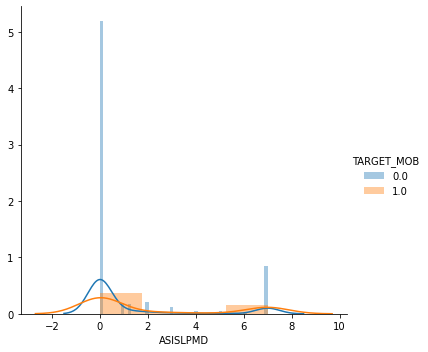

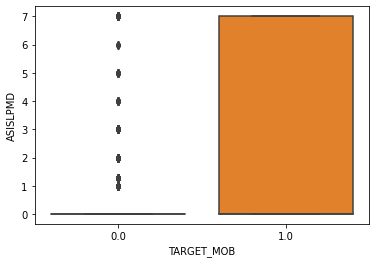

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


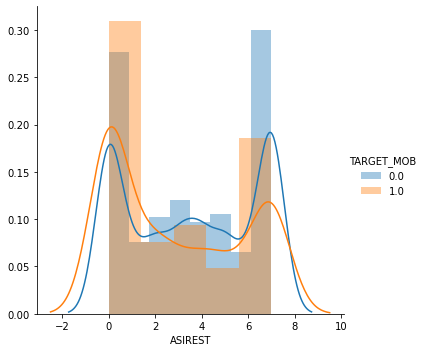

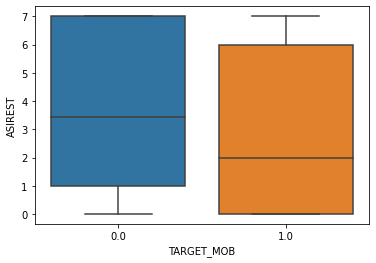

In [25]:
# Bivariate analysis - barplot and boxplot to check the distribution  for target walking variable
numeric_var=['AGE_P','ASISLEEP','ASISLPFL','ASISLPST','ASISLPMD','ASIREST']
for var in numeric_var:
    sns.FacetGrid(dataset_clean, hue="TARGET_MOB", size=5).map(sns.distplot,var).add_legend()
    plt.show()
    sns.boxplot(x="TARGET_MOB", y=var, data=dataset_clean)
    plt.show()

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


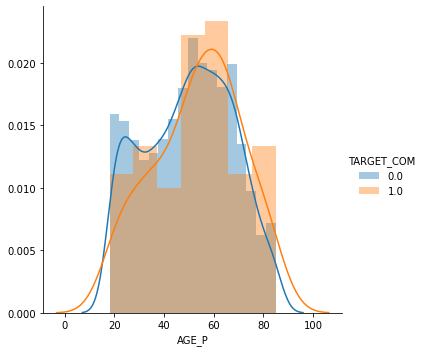

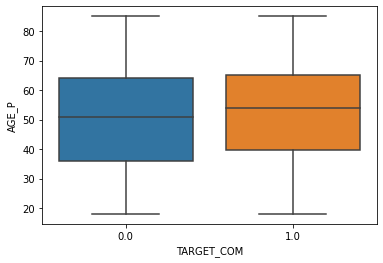

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


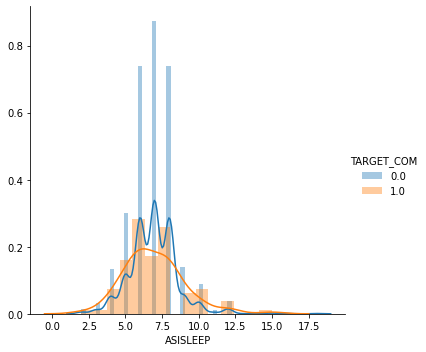

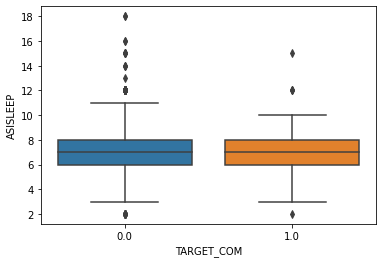

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


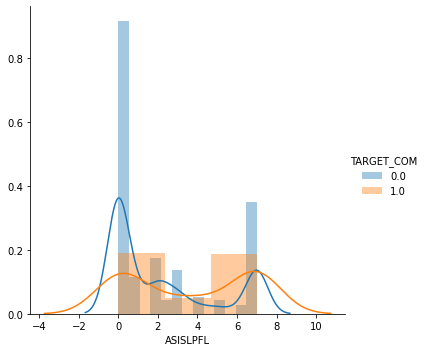

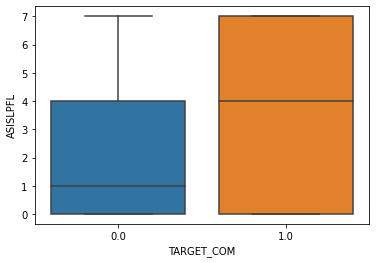

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


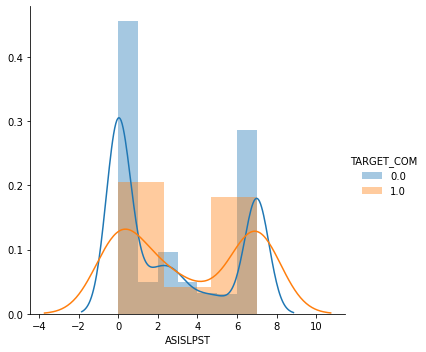

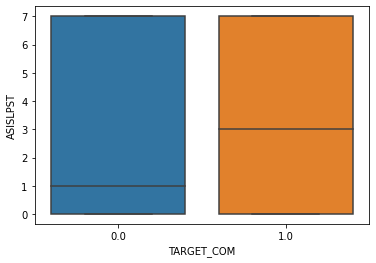

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


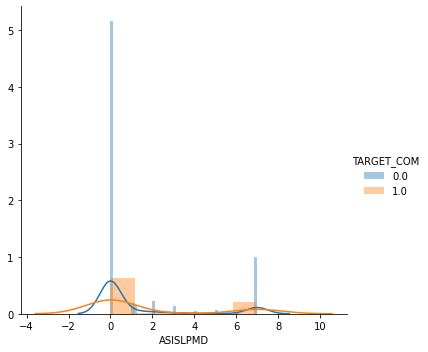

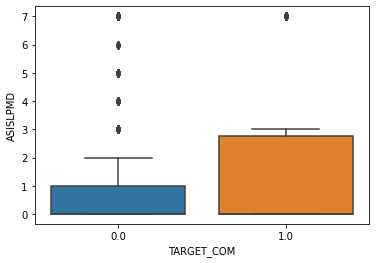

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


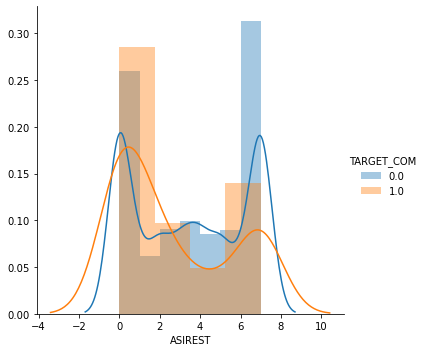

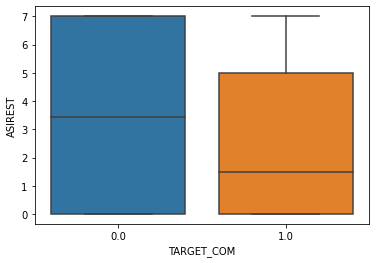

In [26]:
# Bivariate analysis - barplot and boxplot to check the distribution  for target communuication variable
numeric_var=['AGE_P','ASISLEEP','ASISLPFL','ASISLPST','ASISLPMD','ASIREST']
for var in numeric_var:
    sns.FacetGrid(dataset_clean, hue="TARGET_COM", size=5).map(sns.distplot,var).add_legend()
    plt.show()
    sns.boxplot(x="TARGET_COM", y=var, data=dataset_clean)
    plt.show()

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


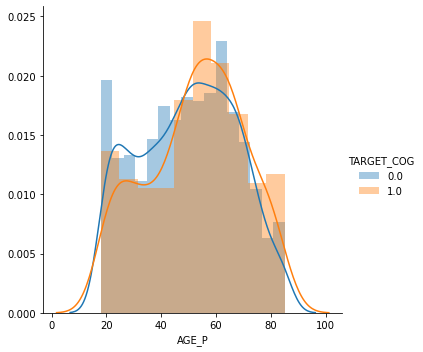

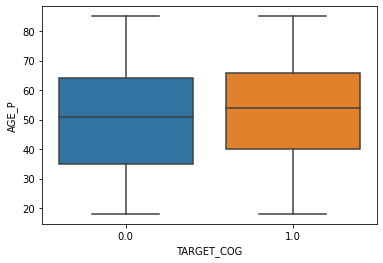

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


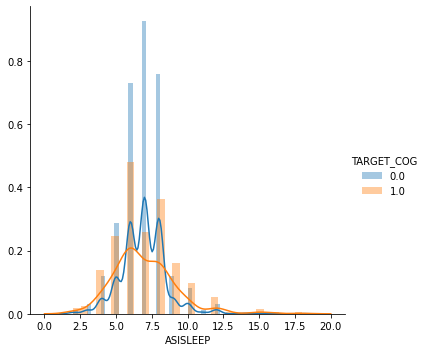

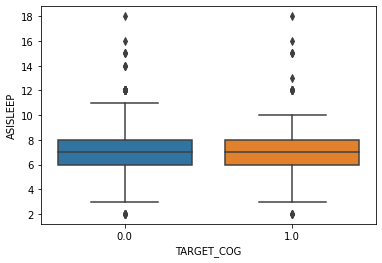

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


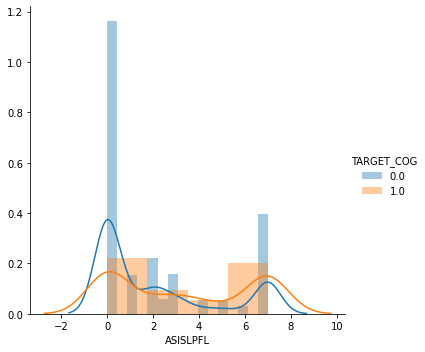

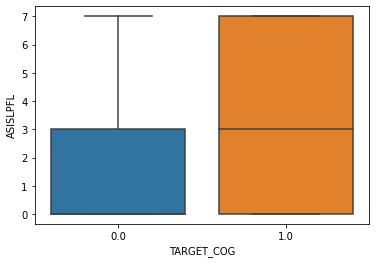

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


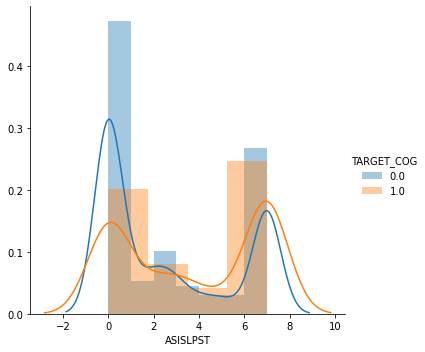

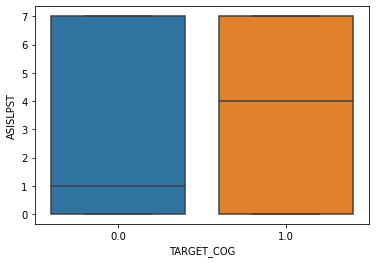

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


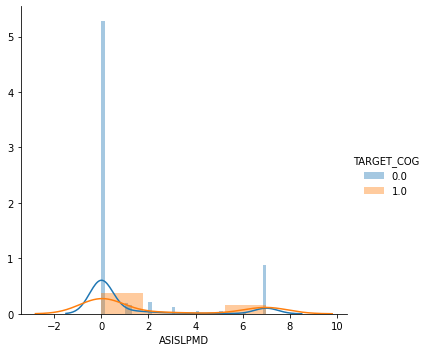

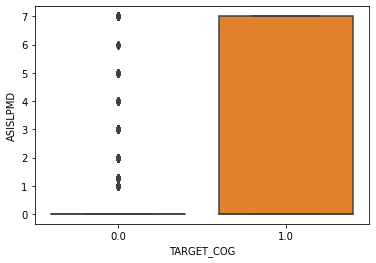

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


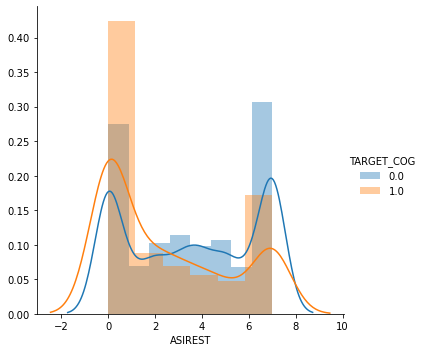

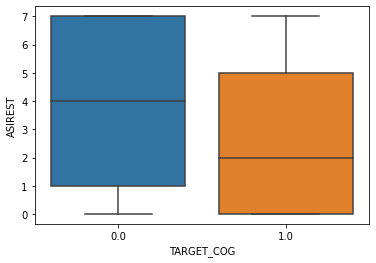

In [27]:
# Bivariate analysis - barplot and boxplot to check the distribution  for target remembering variable
numeric_var=['AGE_P','ASISLEEP','ASISLPFL','ASISLPST','ASISLPMD','ASIREST']
for var in numeric_var:
    sns.FacetGrid(dataset_clean, hue="TARGET_COG", size=5).map(sns.distplot,var).add_legend()
    plt.show()
    sns.boxplot(x="TARGET_COG", y=var, data=dataset_clean)
    plt.show()

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


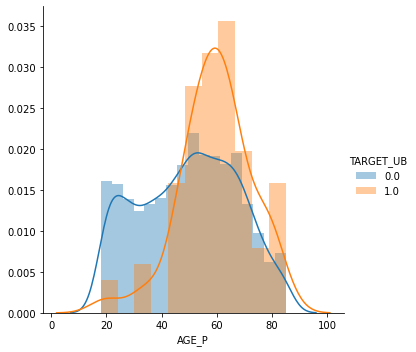

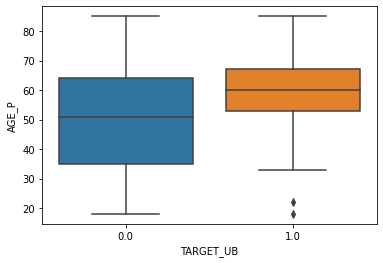

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


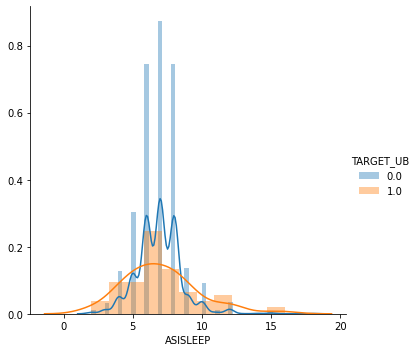

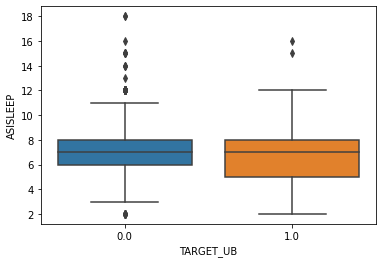

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


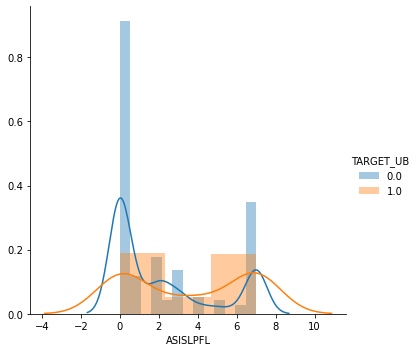

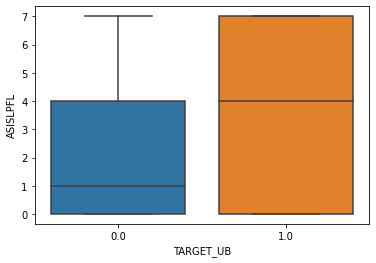

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


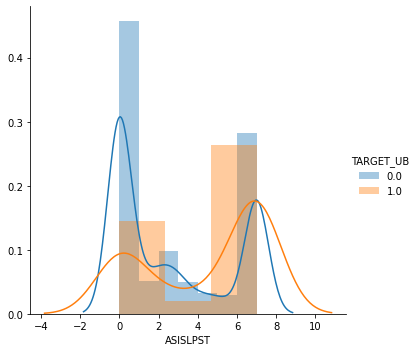

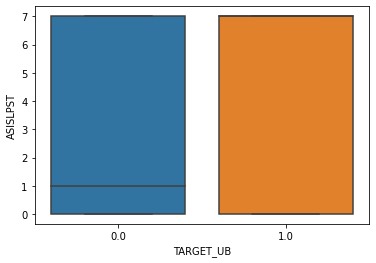

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


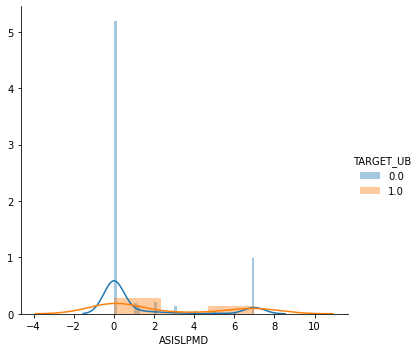

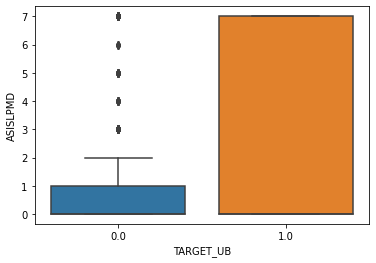

C:\Users\toshi\anaconda3\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\toshi\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


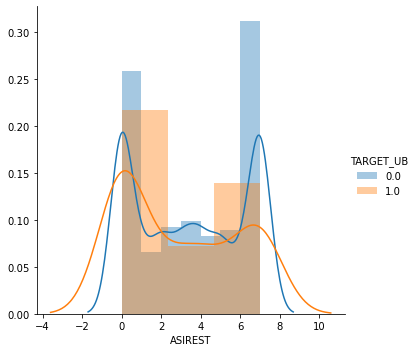

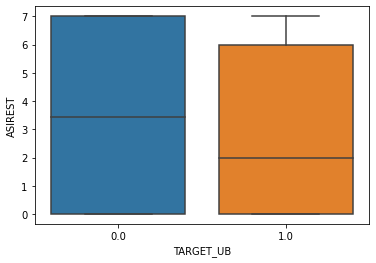

In [28]:
# Bivariate analysis - barplot and boxplot to check the distribution  for target self-care variable
numeric_var=['AGE_P','ASISLEEP','ASISLPFL','ASISLPST','ASISLPMD','ASIREST']
for var in numeric_var:
    sns.FacetGrid(dataset_clean, hue="TARGET_UB", size=5).map(sns.distplot,var).add_legend()
    plt.show()
    sns.boxplot(x="TARGET_UB", y=var, data=dataset_clean)
    plt.show()

# to be continue